# Temperature Forecast Project

In [1]:
from IPython.display import Image
Image(url= "https://chicago.cbslocal.com/wp-content/uploads/sites/15116062/2019/02/warm-wx-weekend.jpg?w=1476")

## Introduction

### Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. People have attempted to predict the weather informally for millennia and formally since the 19th century. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere, land, and ocean and using meteorology to project how the atmosphere will change at a given place.

### This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables

### Attribute Information:
### 1. station - used weather station number: 1 to 25
### 2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
### 3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
### 4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
### 5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
### 6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
### 7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
### 8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
### 9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
### 10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
### 11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
### 12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
### 13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
### 14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
### 15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
### 16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
### 17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
### 18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
### 19. lat - Latitude (Â°): 37.456 to 37.645
### 20. lon - Longitude (Â°): 126.826 to 127.135
### 21. DEM - Elevation (m): 12.4 to 212.3
### 22. Slope - Slope (Â°): 0.1 to 5.2
### 23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
### 24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
### 25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

### I will be using 2 target variable for prediction:
### 1) Next_Tmax: Next day maximum temperature
### 2) Next_Tmin: Next day  minimum temperature

## Libraries

In [2]:
# IMPORTS LIBRARIES
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

# preprocession, normalizing
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# for multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

# models

from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import Lasso, LassoCV

# metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn import metrics 

import warnings
warnings.filterwarnings('ignore')
% matplotlib inline

UsageError: Line magic function `%` not found.


In [2]:
# I have import important libraries for this project in one go so that it will save time.

## Dataset

In [89]:
df = pd.read_csv('temperature.csv')
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [3]:
# It is a big dataset as number of columns is 25. Surely few columns need to drop as it is of no use.

## EDA - Exploratory Data Analysis

In [90]:
df.shape

(7752, 25)

In [4]:
# There are 7752 rows and 25 columns in the dataset.

In [91]:
pd.set_option('display.max_rows',None)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [5]:
# It is a mixed dataset as 1 columns are object type and 24 columns are float type.
# There is few missing values in some columns as count is not matching for every columns.

In [92]:
df.drop_duplicates(inplace = True)

In [93]:
df.drop('Date',inplace=True,axis=1)

In [94]:
df.shape

(7752, 24)

In [6]:
# I have drop Date columns as it is of no use.
# There are no duplicates values in this dataset.

In [95]:
df.nunique()

station               25
Present_Tmax         167
Present_Tmin         155
LDAPS_RHmin         7672
LDAPS_RHmax         7664
LDAPS_Tmax_lapse    7675
LDAPS_Tmin_lapse    7675
LDAPS_WS            7675
LDAPS_LH            7675
LDAPS_CC1           7569
LDAPS_CC2           7582
LDAPS_CC3           7599
LDAPS_CC4           7524
LDAPS_PPT1          2812
LDAPS_PPT2          2510
LDAPS_PPT3          2356
LDAPS_PPT4          1918
lat                   12
lon                   25
DEM                   25
Slope                 27
Solar radiation     1575
Next_Tmax            183
Next_Tmin            157
dtype: int64

In [7]:
# There are few columns which are categorical in nature and few columns are continous in nature.

In [96]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
station,7750.0,13.000000,7.211568,1.000000,7.000000,13.000000,19.000000,25.000000
Present_Tmax,7682.0,29.768211,2.969999,20.000000,27.800000,29.900000,32.000000,37.600000
Present_Tmin,7682.0,23.225059,2.413961,11.300000,21.700000,23.400000,24.900000,29.900000
LDAPS_RHmin,7677.0,56.759372,14.668111,19.794666,45.963543,55.039024,67.190056,98.524734
LDAPS_RHmax,7677.0,88.374804,7.192004,58.936283,84.222862,89.793480,93.743629,100.000153
LDAPS_Tmax_lapse,7677.0,29.613447,2.947191,17.624954,27.673499,29.703426,31.710450,38.542255
LDAPS_Tmin_lapse,7677.0,23.512589,2.345347,14.272646,22.089739,23.760199,25.152909,29.619342
LDAPS_WS,7677.0,7.097875,2.183836,2.882580,5.678705,6.547470,8.032276,21.857621
LDAPS_LH,7677.0,62.505019,33.730589,-13.603212,37.266753,56.865482,84.223616,213.414006
LDAPS_CC1,7677.0,0.368774,0.262458,0.000000,0.146654,0.315697,0.575489,0.967277


In [8]:
# There is few missing values in some columns as count is not matching for every columns.
# The difference between the mean and 50% is not much.
# There are outlires in the dataset which i will remove it soon.

## Filling the missing values

In [97]:
# filling the missing values of continious columns
df['Present_Tmax'].fillna(df['Present_Tmax'].mean(),inplace=True)
df['Present_Tmin'].fillna(df['Present_Tmin'].mean(),inplace=True)
df['LDAPS_RHmin'].fillna(df['LDAPS_RHmin'].mean(),inplace=True)
df['LDAPS_RHmax'].fillna(df['LDAPS_RHmax'].mean(),inplace=True)
df['LDAPS_Tmax_lapse'].fillna(df['LDAPS_Tmax_lapse'].mean(),inplace=True)
df['LDAPS_Tmin_lapse'].fillna(df['LDAPS_Tmin_lapse'].mean(),inplace=True)
df['LDAPS_WS'].fillna(df['LDAPS_WS'].mean(),inplace=True)
df['LDAPS_LH'].fillna(df['LDAPS_LH'].mean(),inplace=True)
df['LDAPS_CC1'].fillna(df['LDAPS_CC1'].mean(),inplace=True)
df['LDAPS_CC2'].fillna(df['LDAPS_CC2'].mean(),inplace=True)
df['LDAPS_CC3'].fillna(df['LDAPS_CC3'].mean(),inplace=True)
df['LDAPS_CC4'].fillna(df['LDAPS_CC4'].mean(),inplace=True)
df['LDAPS_PPT1'].fillna(df['LDAPS_PPT1'].mean(),inplace=True)
df['LDAPS_PPT2'].fillna(df['LDAPS_PPT2'].mean(),inplace=True)
df['LDAPS_PPT3'].fillna(df['LDAPS_PPT3'].mean(),inplace=True)
df['LDAPS_PPT4'].fillna(df['LDAPS_PPT4'].mean(),inplace=True)
df['Next_Tmax'].fillna(df['Next_Tmax'].mean(),inplace=True)
df['Next_Tmin'].fillna(df['Next_Tmin'].mean(),inplace=True)

# filling the missing values of categorical columns
df['station'].fillna(df['station'].mode()[0],inplace=True)

In [9]:
# There are few missing values in above columns which i replace it with the help of mean and mode.

In [98]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [10]:
# Now there is no null values in any columns of the dataset.

In [99]:
# Replacing continous columns with mean
df['LDAPS_CC1'] = df['LDAPS_CC1'].replace(0,df['LDAPS_CC1'].mean())
df['LDAPS_CC2'] = df['LDAPS_CC2'].replace(0,df['LDAPS_CC2'].mean())
df['LDAPS_CC3'] = df['LDAPS_CC3'].replace(0,df['LDAPS_CC3'].mean())
df['LDAPS_CC4'] = df['LDAPS_CC4'].replace(0,df['LDAPS_CC4'].mean())
df['LDAPS_PPT1'] = df['LDAPS_PPT1'].replace(0,df['LDAPS_PPT1'].mean())
df['LDAPS_PPT2'] = df['LDAPS_PPT2'].replace(0,df['LDAPS_PPT2'].mean())
df['LDAPS_PPT3'] = df['LDAPS_PPT3'].replace(0,df['LDAPS_PPT3'].mean())
df['LDAPS_PPT4'] = df['LDAPS_PPT4'].replace(0,df['LDAPS_PPT4'].mean())

In [11]:
# There are few 0 values in above columns which i replaced it with mean.

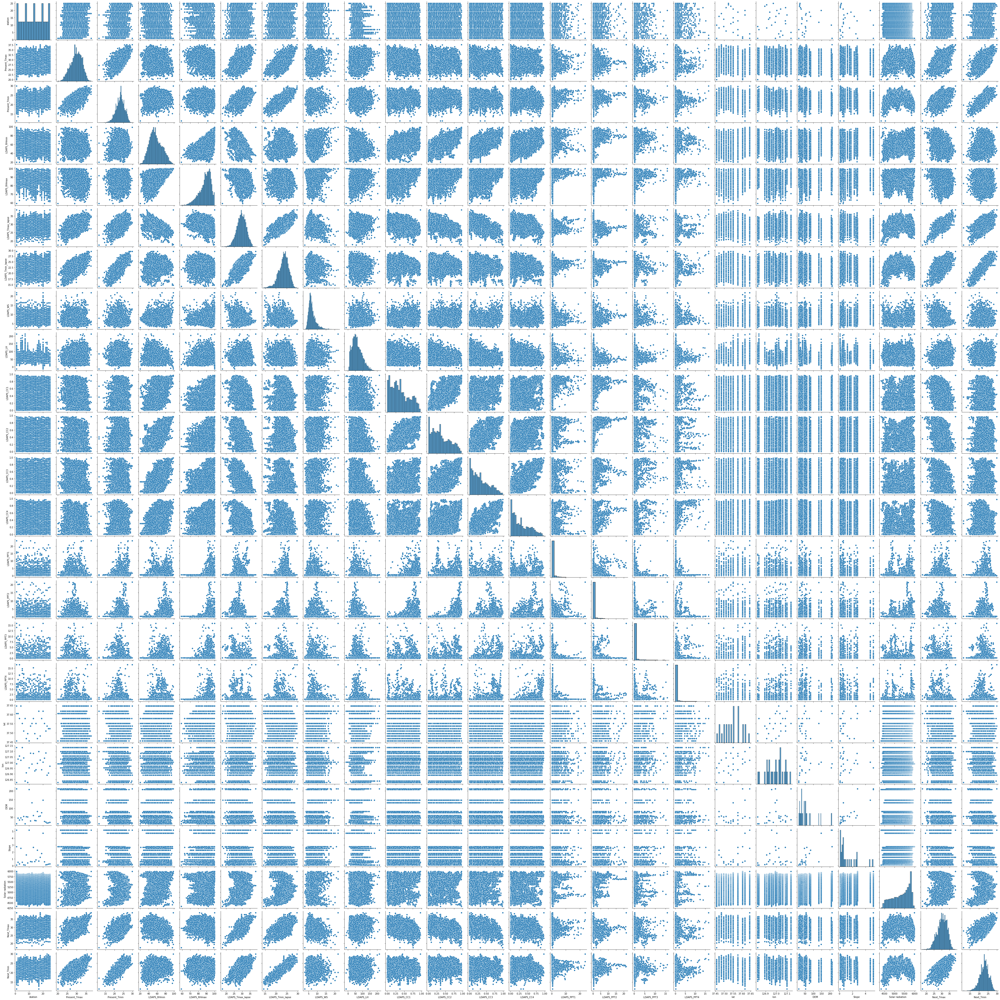

In [14]:
sns.pairplot(df)

In [12]:
# The above pair plot gives us the clear idea that target variable are positively corelated with few feature.
# Only few columns are not correlated.

## Bar Plot

### station

<AxesSubplot:xlabel='station', ylabel='Next_Tmax'>

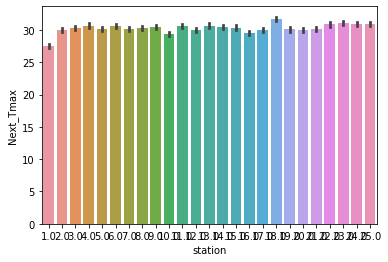

In [17]:
sns.barplot(df['station'],df['Next_Tmax'])

In [13]:
# The 18 station have max temperature.

<AxesSubplot:xlabel='station', ylabel='Next_Tmin'>

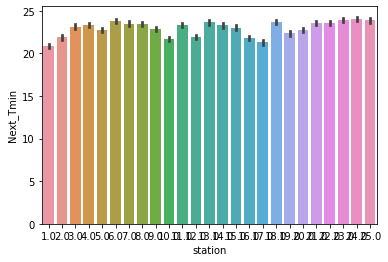

In [18]:
sns.barplot(df['station'],df['Next_Tmin'])

In [14]:
# Te 1 station have min temperatue.

### DEM

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmax'>

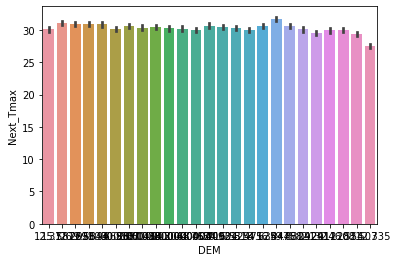

In [24]:
sns.barplot(df['DEM'],df['Next_Tmax'])

In [15]:
# Dem doesnt affect much the temperature.

<AxesSubplot:xlabel='DEM', ylabel='Next_Tmin'>

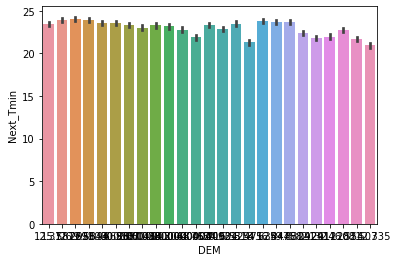

In [25]:
sns.barplot(df['DEM'],df['Next_Tmin'])

In [16]:
# Dem doesnt affect much the temperature.

## Strip Plot

### lat

<AxesSubplot:xlabel='lat', ylabel='Next_Tmax'>

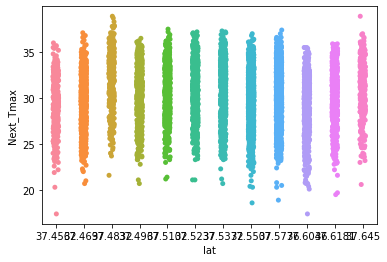

In [19]:
sns.stripplot(df['lat'],df['Next_Tmax'])

In [17]:
# The above strip plot gives me an clear idea that latitude doesn't affect much the temperature.

<AxesSubplot:xlabel='lat', ylabel='Next_Tmin'>

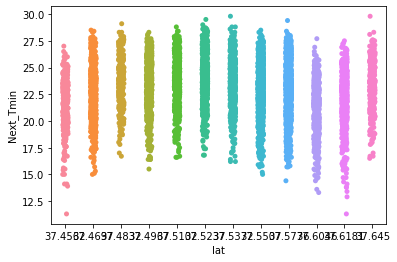

In [20]:
sns.stripplot(df['lat'],df['Next_Tmin'])

In [ ]:
# The above strip plot gives me an clear idea that latitude doesn't affect much the temperature.

## Boxplot

### lon

<AxesSubplot:xlabel='lon', ylabel='Next_Tmax'>

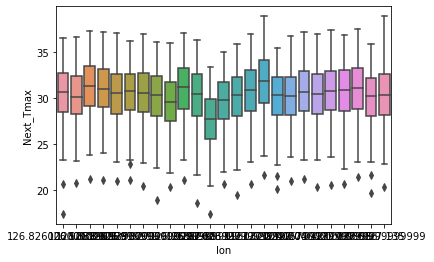

In [22]:
sns.boxplot(df['lon'],df['Next_Tmax'])

In [18]:
# Temperature is almost same for all the longitude.

<AxesSubplot:xlabel='lon', ylabel='Next_Tmin'>

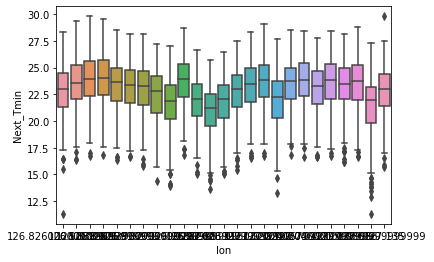

In [23]:
sns.boxplot(df['lon'],df['Next_Tmin'])

In [19]:
# Temperature is almost same for all the longitude.

## i) Using Next_Tmax Label for Model Building

In [28]:
y=df['Next_Tmax']
x=df.drop(columns=['Next_Tmax'])

In [20]:
# I have divided dataset into feature and label.

### Scatter Plot

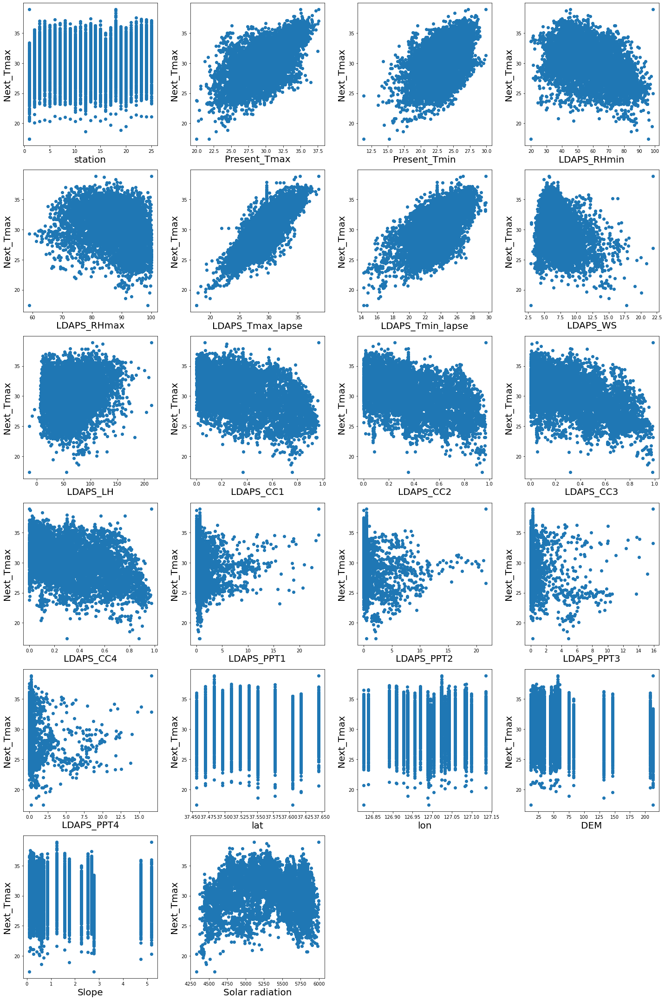

In [29]:
# visualizing the relationship
plt.figure(figsize=(20,30),facecolor='white')
plotnumber = 1

for column in df:
    if plotnumber<=22:
        ax = plt.subplot(6,4,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Next_Tmax',fontsize=20)
        plotnumber +=1 
        plt.tight_layout()  

In [21]:
# Scatter Plot gives the clear idea that almost all the features are positively correlated with Next_Tmax except LDAPS_CC3.

### Distribution Plot

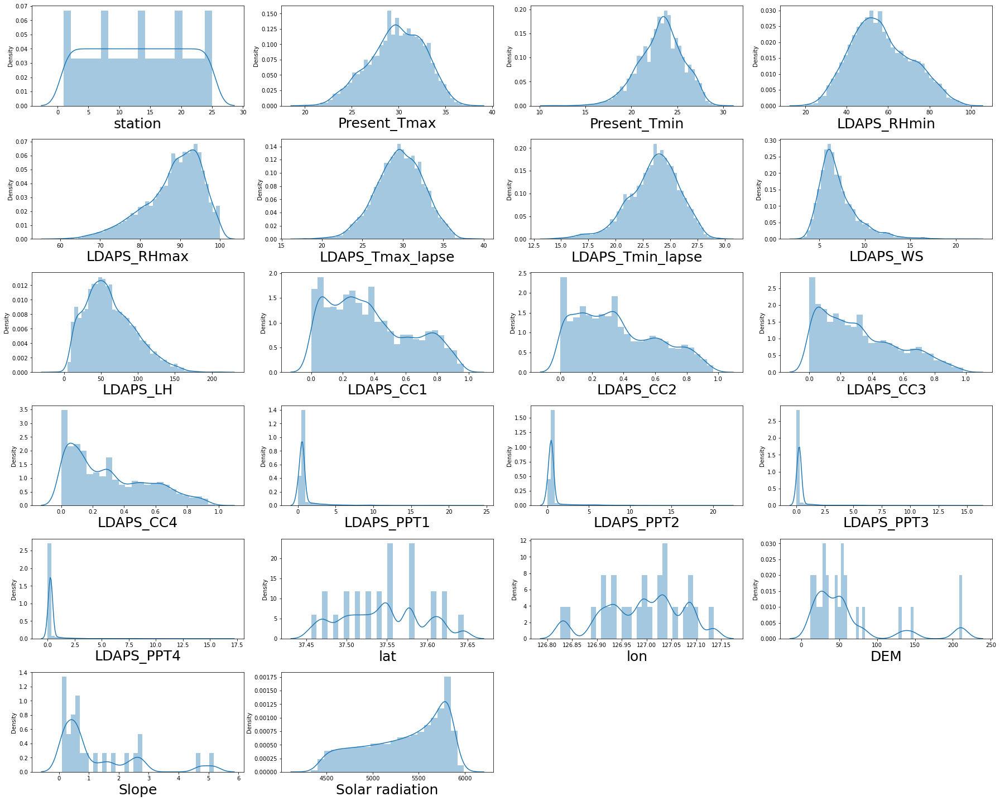

In [30]:
# using the the distribution plot 

plt.figure(figsize=(25,20), facecolor='white')
plotnumber = 1

for column in df:
    if plotnumber<=22:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=25)
    plotnumber+=1
plt.tight_layout() 

In [22]:
# There are skewness in the dataset which i will remove soon.

## Box Plot

station                AxesSubplot(0.125,0.772143;0.168478x0.107857)
Present_Tmax        AxesSubplot(0.327174,0.772143;0.168478x0.107857)
Present_Tmin        AxesSubplot(0.529348,0.772143;0.168478x0.107857)
LDAPS_RHmin         AxesSubplot(0.731522,0.772143;0.168478x0.107857)
LDAPS_RHmax            AxesSubplot(0.125,0.642714;0.168478x0.107857)
LDAPS_Tmax_lapse    AxesSubplot(0.327174,0.642714;0.168478x0.107857)
LDAPS_Tmin_lapse    AxesSubplot(0.529348,0.642714;0.168478x0.107857)
LDAPS_WS            AxesSubplot(0.731522,0.642714;0.168478x0.107857)
LDAPS_LH               AxesSubplot(0.125,0.513286;0.168478x0.107857)
LDAPS_CC1           AxesSubplot(0.327174,0.513286;0.168478x0.107857)
LDAPS_CC2           AxesSubplot(0.529348,0.513286;0.168478x0.107857)
LDAPS_CC3           AxesSubplot(0.731522,0.513286;0.168478x0.107857)
LDAPS_CC4              AxesSubplot(0.125,0.383857;0.168478x0.107857)
LDAPS_PPT1          AxesSubplot(0.327174,0.383857;0.168478x0.107857)
LDAPS_PPT2          AxesSubplot(0.

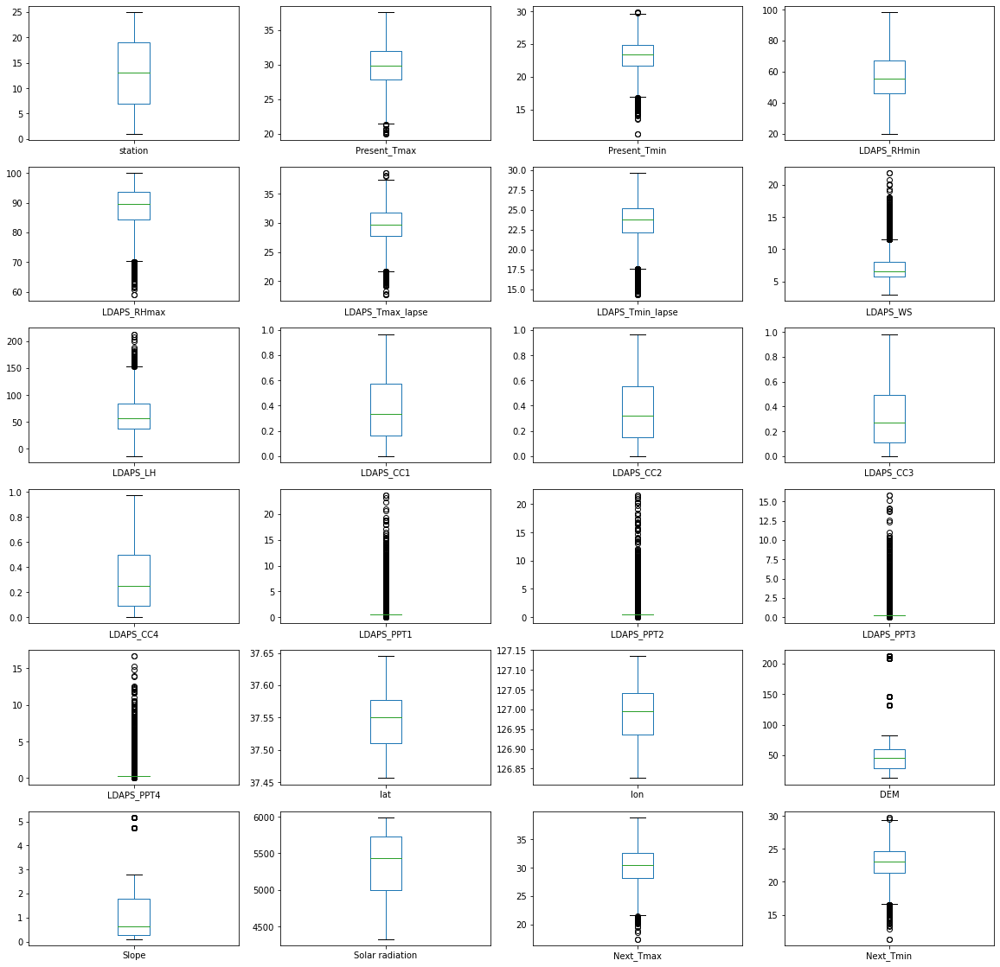

In [31]:
df.plot(kind='box',subplots=True,layout=(6,4),figsize=(20,20))

In [23]:
# There are outliers in the dataset that i will remove it with the help of z score.

## Z score

In [32]:
z_score = zscore(df[['Present_Tmax','Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','Next_Tmax','Next_Tmin']])
abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 3).all(axis = 1)
df = df[filtering_entry]
df.shape

(6908, 24)

In [24]:
# I have applied z score to clean the dataset so that outliers will be removed and model accuracy can be improved.
# Now i have 6908 rows and 24 columns left in the dataset for prediction.

## Visualize the correlation

In [33]:
df.drop('Next_Tmax',axis=1).corrwith(df.Next_Tmax)

station             0.105106
Present_Tmax        0.585181
Present_Tmin        0.444685
LDAPS_RHmin        -0.427650
LDAPS_RHmax        -0.299805
LDAPS_Tmax_lapse    0.805432
LDAPS_Tmin_lapse    0.538857
LDAPS_WS           -0.276965
LDAPS_LH            0.172685
LDAPS_CC1          -0.455063
LDAPS_CC2          -0.485326
LDAPS_CC3          -0.481657
LDAPS_CC4          -0.420266
LDAPS_PPT1         -0.156618
LDAPS_PPT2         -0.119099
LDAPS_PPT3         -0.047899
LDAPS_PPT4         -0.087755
lat                -0.045941
lon                 0.008520
DEM                -0.152845
Slope              -0.085377
Solar radiation    -0.032497
Next_Tmin           0.584801
dtype: float64

## correlation

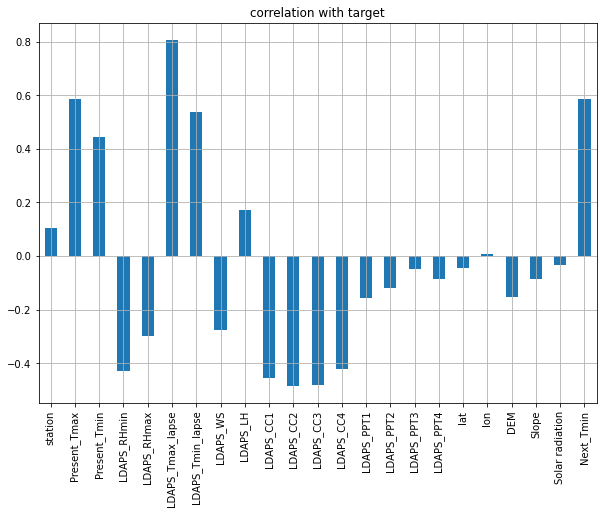

In [34]:
df.drop('Next_Tmax',axis=1).corrwith(df.Next_Tmax).plot(kind='bar',grid=True,figsize=(10,7),title="correlation with target")
plt.show()

In [25]:
# The above plot gives me an clear idea that few columns are positively correlated and few are negatively correlated with label.
# However i will use all the columns for model prediction.

## Standard Scaler

In [35]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_scaled

array([[-1.66329184, -0.36132577, -0.75952931, ...,  1.11500407,
         1.51793488, -0.6975993 ],
       [-1.52464842,  0.72108401, -0.6762959 , ..., -0.54215762,
         1.22994952, -0.17406357],
       [-1.38600499,  0.61960809,  0.03118815, ..., -0.7231326 ,
         1.21653443,  0.38974413],
       ...,
       [ 1.66415031, -2.22171758, -2.42419767, ..., -0.71933797,
        -2.0743251 , -2.2279345 ],
       [-1.66329184, -3.30412736, -4.9628169 , ..., -0.8454552 ,
        -2.35821196, -4.68452522],
       [-1.66329184,  2.64912642,  2.77789093, ...,  2.86143459,
         1.51793488,  2.76579089]])

In [26]:
# Standard scaler is basically scaling the date in one range so that it will be easy for Model building.

### VIF - variance inflation factor

In [36]:
# finding variance inflation factor(vif)

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x_scaled,i) for i in range (x_scaled.shape[1])]
vif["Features"] = x.columns
vif

,vif,Features
0,1.229075,station
1,2.773543,Present_Tmax
2,3.479177,Present_Tmin
3,6.357583,LDAPS_RHmin
4,2.192886,LDAPS_RHmax
5,7.532260,LDAPS_Tmax_lapse
6,9.081873,LDAPS_Tmin_lapse
7,1.267791,LDAPS_WS
8,1.514096,LDAPS_LH
9,3.130169,LDAPS_CC1


In [27]:
# VIF is used to detect the severity of multicollinearity in the ordinary least square (OLS) regression analysis.
# Multicollinearity is a phenomenon when two or more independent variables are highly intercorrelated.
# From the above stats i can say that none of the features are highly intercorrelated it means Multicollinearity doesn't exist.

## Model Building

In [37]:
x_train,x_test,y_train,y_test = train_test_split(x_scaled,y,test_size=0.25,random_state = 370)

In [28]:
# For model prediction i am dividing the dataset into 2 parts.
# One part is used for training purpose i.e 75% dataset.
# other part is used for testing purpose i.e 25% dataset.

## Linear Regression model

In [38]:
rg = LinearRegression()
rg.fit(x_train,y_train)

LinearRegression()

In [39]:
# adjusted r2 score
rg.score(x_train,y_train)

0.7915016774724632

In [40]:
rg.score(x_test,y_test)

0.799062706926219

In [41]:
y_pred = rg.predict(x_test)
y_pred

array([31.22596718, 34.0380778 , 25.70468773, ..., 29.19615964,
       31.58098931, 31.48128835])

### Scatter plot of Linear Regression

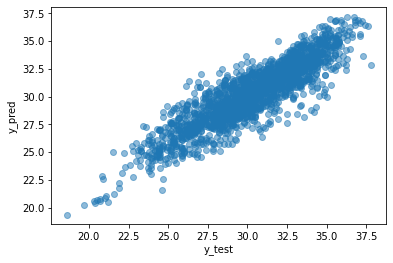

In [42]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [43]:
mean_squared_error(y_test,y_pred)

2.0133668237329707

### RMSE

In [44]:
np.sqrt(mean_squared_error(y_test,y_pred))

1.4189315782422247

### r2 score

In [45]:
r2_score(y_test,y_pred)

0.799062706926219

In [29]:
# Linear Regression accuracy score 80%

## Random Forest Regressor

In [46]:
rf = RandomForestRegressor()
rf.fit(x_train,y_train)

RandomForestRegressor()

In [47]:
# adjusted r2 score
rf.score(x_train,y_train)

0.9856110335198243

In [48]:
rf.score(x_test,y_test)

0.9093222135994427

In [49]:
y_pred = rf.predict(x_test)
y_pred

array([30.856, 34.638, 25.228, ..., 31.717, 31.714, 30.519])

### Scatter plot of Random Forest Regressor Model

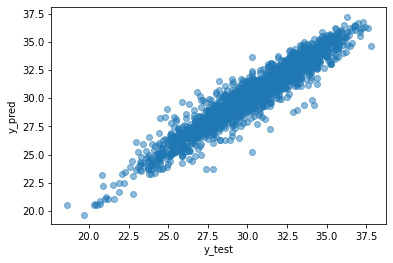

In [50]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [51]:
mean_squared_error(y_test,y_pred)

0.9085802042799037

### RMSE

In [52]:
np.sqrt(mean_squared_error(y_test,y_pred))

0.9531947357596472

### r2 score

In [53]:
r2_score(y_test,y_pred)

0.9093222135994427

In [30]:
# Random Forest Regression accuracy score 91%

## Decision Tree Regressor Model

In [54]:
dt = DecisionTreeRegressor()
dt.fit(x_train,y_train)

DecisionTreeRegressor()

In [55]:
# adjusted r2 score
dt.score(x_train,y_train)

1.0

In [56]:
dt.score(x_test,y_test)

0.798981171464173

In [57]:
y_pred = dt.predict(x_test)
y_pred

array([29.6, 33.6, 25. , ..., 32.5, 31.1, 32.5])

### Scatter plot of Decision Tree Regressor Model

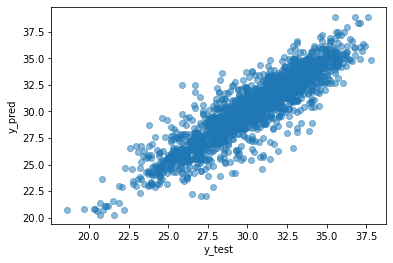

In [58]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [59]:
mean_squared_error(y_test,y_pred)

2.014183798977982

### RMSE

In [60]:
np.sqrt(mean_squared_error(y_test,y_pred))

1.4192194329905372

### r2 score

In [61]:
r2_score(y_test,y_pred)

0.798981171464173

In [31]:
# Decision Tree Regressor accuracy score 80%

## ADA BOOST REGRESSOR

In [62]:
ada = AdaBoostRegressor()
ada.fit(x_train,y_train)

AdaBoostRegressor()

In [63]:
# adjusted r2 score
ada.score(x_train,y_train)

0.7739980363284577

In [64]:
ada.score(x_test,y_test)

0.7750064246836214

In [65]:
y_pred = ada.predict(x_test)
y_pred

array([30.71978728, 32.74569356, 27.26752173, ..., 28.98551219,
       31.7       , 31.04799357])

### Scatter plot of AdaBoost Regressor

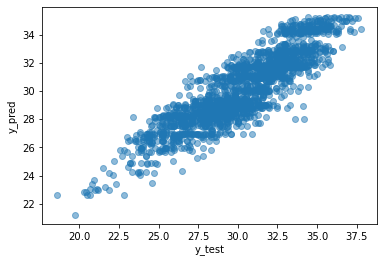

In [66]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [67]:
mean_squared_error(y_test,y_pred)

2.2544077964100455

### RMSE

In [68]:
np.sqrt(mean_squared_error(y_test,y_pred))

1.5014685465936493

### r2 score

In [69]:
r2_score(y_test,y_pred)

0.7750064246836214

In [32]:
# ADA BOOST Regressor accuracy score 77%

### Hyperparameter Tuning in Random Forest Regressor Model

#### Using RandomizedSearchCV method for improving the r2 score

In [70]:
#Randomized Search CV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

In [71]:
# Create the random grid

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [72]:
# Random search of parameters, using 5 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [73]:
rf_random.fit(x_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=  13.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=  13.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [74]:
rf_random.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [75]:
prediction = rf_random.predict(x_test)

### Scatter Plot

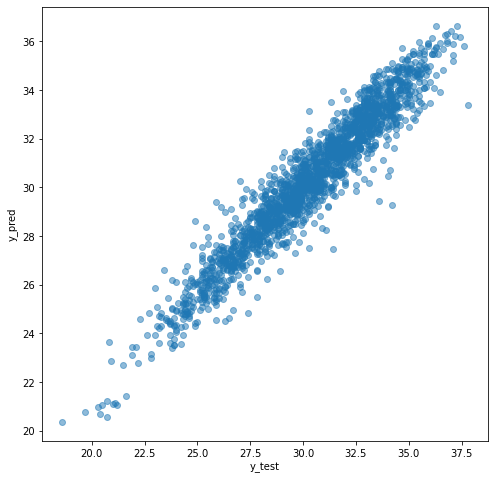

In [76]:
plt.figure(figsize = (8,8))
plt.scatter(y_test, prediction, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [77]:
mean_squared_error(y_test,y_pred)

2.2544077964100455

### RMSE

In [78]:
np.sqrt(mean_squared_error(y_test,y_pred))

1.5014685465936493

### r2 score

In [79]:
r2_score(y_test,y_pred)

0.7750064246836214

In [ ]:
# I have tried to improve the accuracy score for random forest regressor model but it is reducing the accuracy score.

### Regularization

In [80]:
# lasso regularization
lasscv = LassoCV(alphas = None,cv=10,max_iter=5000,normalize=True)

In [81]:
lasscv.fit(x_train,y_train)

LassoCV(cv=10, max_iter=5000, normalize=True)

In [82]:
# best alphas parameters

alpha = lasscv.alpha_
alpha

3.363241144056557e-05

In [83]:
# now we have best parameter lets use the lasso regularization

lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train,y_train)

Lasso(alpha=3.363241144056557e-05)

In [84]:
lasso_reg.score(x_test,y_test)

0.7990641382262869

In [ ]:
# I have tried to improve the accuracy score for Linear Regression with the help of lasso but it is not increasing.

## Saving the Best Model

In [85]:
import pickle

In [86]:
# saving the Random Forest Regressor Model

filename = 'finalized_model.pickle'
pickle.dump(rf,open(filename,'wb'))

loaded_model = pickle.load(open(filename,'rb'))

In [35]:
from IPython.display import Image
Image(url= "https://i.ytimg.com/vi/xD0FJns7vX0/maxresdefault.jpg")

In [34]:
# The best model is Random Forest Regressor whose accuracy score is 91%

## ii) Using Next_Tmin Label for predicting

In [100]:
y=df['Next_Tmin']
x=df.drop(columns=['Next_Tmin'])

In [37]:
# I have divided dataset into feature and label.

### Scatter Plot

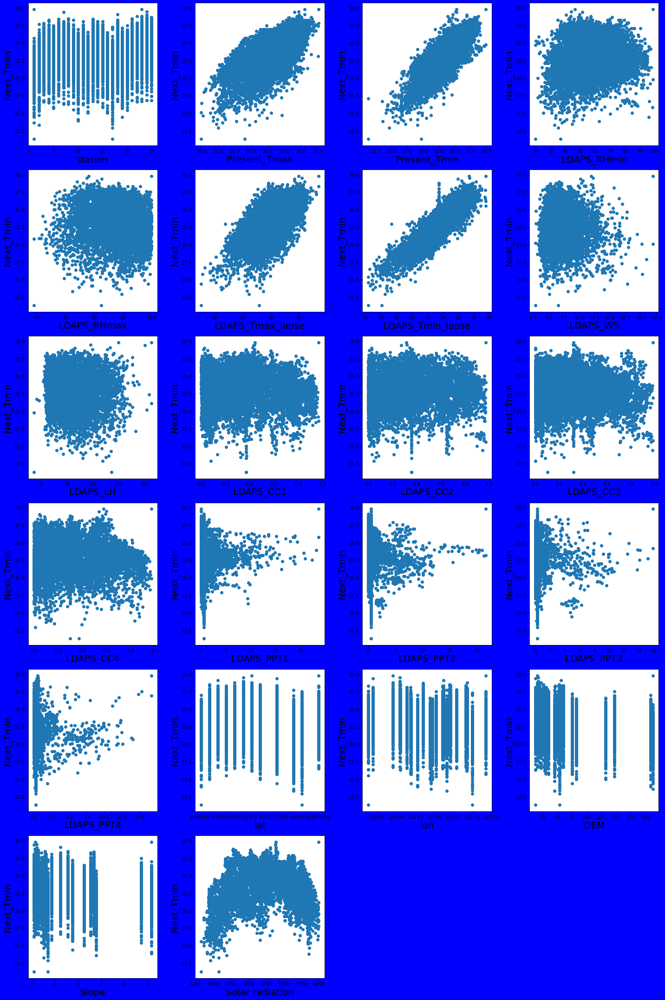

In [102]:
# visualizing the relationship
plt.figure(figsize=(20,30),facecolor='blue')
plotnumber = 1

for column in df:
    if plotnumber<=22:
        ax = plt.subplot(6,4,plotnumber)
        plt.scatter(x[column],y)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('Next_Tmin',fontsize=20)
        plotnumber +=1 
        plt.tight_layout()  

In [36]:
# Scatter Plot gives the clear idea that almost all the features are positively correlated

### Distribution Plot

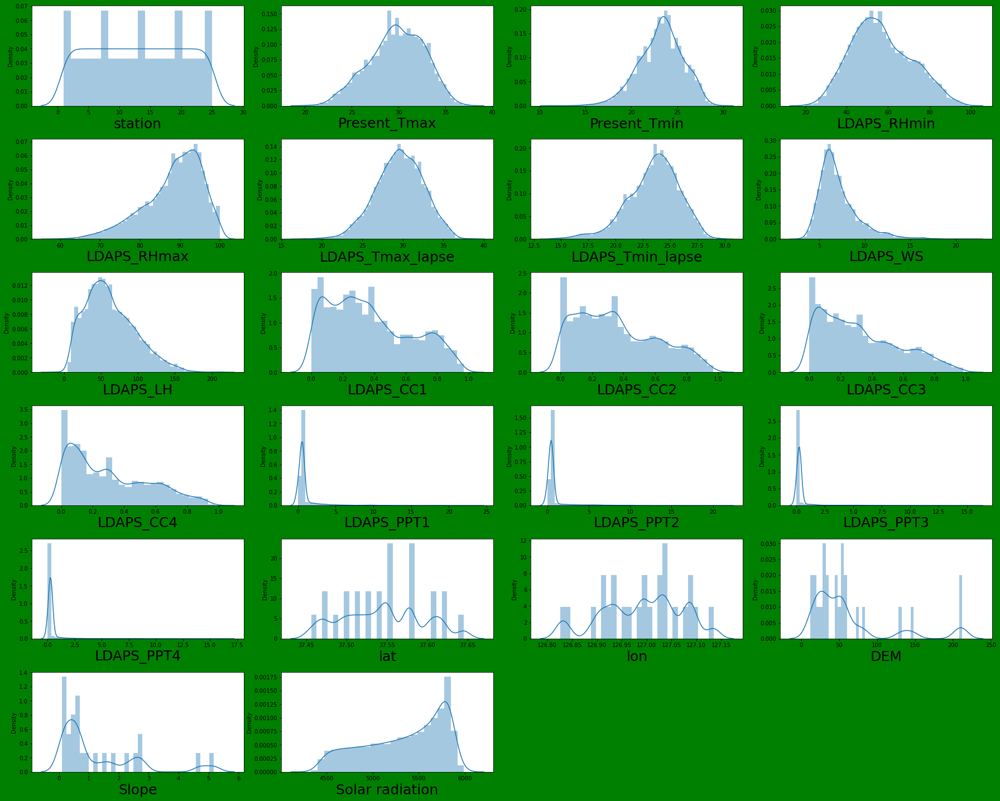

In [103]:
# using the the distribution plot 

plt.figure(figsize=(25,20), facecolor='green')
plotnumber = 1

for column in df:
    if plotnumber<=22:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=25)
    plotnumber+=1
plt.tight_layout() 

In [38]:
# There are skewness in the dataset which i will remove soon.

### Box Plot

station                AxesSubplot(0.125,0.772143;0.168478x0.107857)
Present_Tmax        AxesSubplot(0.327174,0.772143;0.168478x0.107857)
Present_Tmin        AxesSubplot(0.529348,0.772143;0.168478x0.107857)
LDAPS_RHmin         AxesSubplot(0.731522,0.772143;0.168478x0.107857)
LDAPS_RHmax            AxesSubplot(0.125,0.642714;0.168478x0.107857)
LDAPS_Tmax_lapse    AxesSubplot(0.327174,0.642714;0.168478x0.107857)
LDAPS_Tmin_lapse    AxesSubplot(0.529348,0.642714;0.168478x0.107857)
LDAPS_WS            AxesSubplot(0.731522,0.642714;0.168478x0.107857)
LDAPS_LH               AxesSubplot(0.125,0.513286;0.168478x0.107857)
LDAPS_CC1           AxesSubplot(0.327174,0.513286;0.168478x0.107857)
LDAPS_CC2           AxesSubplot(0.529348,0.513286;0.168478x0.107857)
LDAPS_CC3           AxesSubplot(0.731522,0.513286;0.168478x0.107857)
LDAPS_CC4              AxesSubplot(0.125,0.383857;0.168478x0.107857)
LDAPS_PPT1          AxesSubplot(0.327174,0.383857;0.168478x0.107857)
LDAPS_PPT2          AxesSubplot(0.

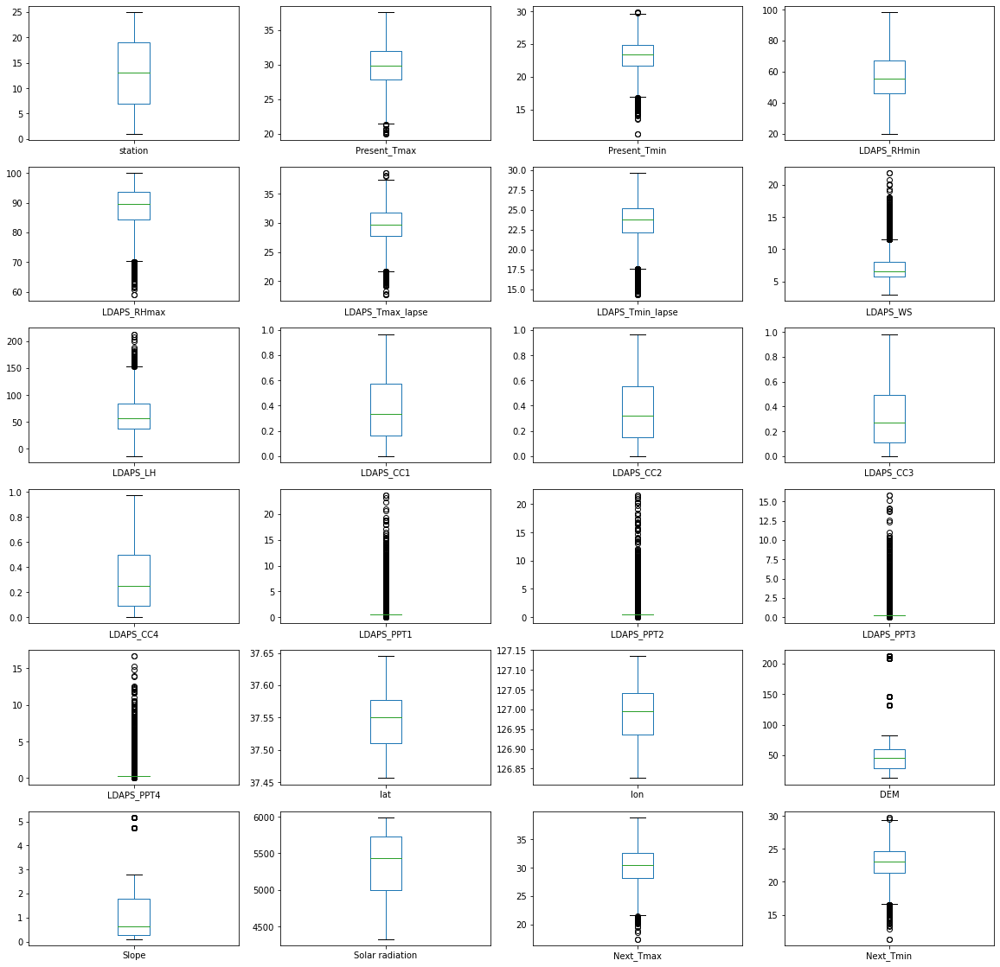

In [104]:
df.plot(kind='box',subplots=True,layout=(6,4),figsize=(20,20))

In [39]:
# There are outliers in few dataset whic i will remove it from z score.

# Z score

In [105]:
z_score = zscore(df[['Present_Tmax','Present_Tmin','LDAPS_RHmax','LDAPS_Tmax_lapse','LDAPS_Tmin_lapse','LDAPS_WS','LDAPS_LH','LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4','Next_Tmax','Next_Tmin']])
abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 3).all(axis = 1)
df = df[filtering_entry]
df.shape

(6908, 24)

In [40]:
# After removing outliers there are 6908 rows and 24 columns in the dataset.

## Visualize the correlation

In [106]:
df.drop('Next_Tmin',axis=1).corrwith(df.Next_Tmin)

station             0.129374
Present_Tmax        0.616781
Present_Tmin        0.784656
LDAPS_RHmin         0.132780
LDAPS_RHmax        -0.096419
LDAPS_Tmax_lapse    0.546751
LDAPS_Tmin_lapse    0.867120
LDAPS_WS           -0.014091
LDAPS_LH           -0.046104
LDAPS_CC1          -0.008022
LDAPS_CC2           0.060249
LDAPS_CC3          -0.005792
LDAPS_CC4          -0.053653
LDAPS_PPT1         -0.038432
LDAPS_PPT2         -0.004142
LDAPS_PPT3          0.031977
LDAPS_PPT4         -0.080105
lat                -0.076733
lon                -0.044608
DEM                -0.238340
Slope              -0.138172
Solar radiation     0.074943
Next_Tmax           0.584801
dtype: float64

## correlation

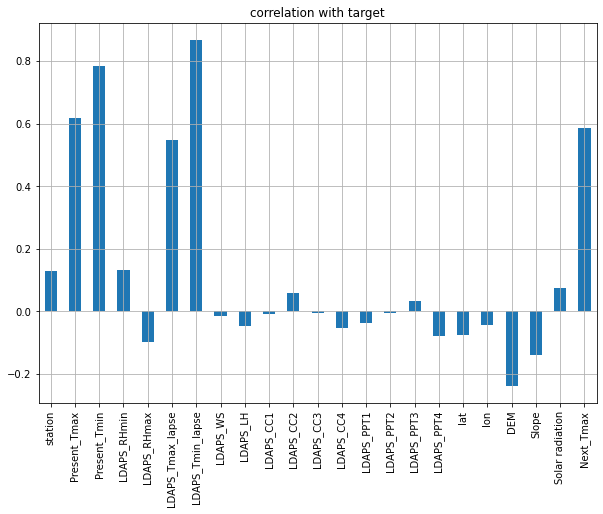

In [107]:
df.drop('Next_Tmin',axis=1).corrwith(df.Next_Tmin).plot(kind='bar',grid=True,figsize=(10,7),title="correlation with target")
plt.show()

In [41]:
# The above plot gives me an clear idea that few columns are positively correlated and only 2 columns are negatively correlated with label.
# However i will use all the columns for model prediction.

## StandardScaler

In [108]:
# standard scaler

scaler = StandardScaler()
x_scaled = scaler.fit_transform(x)
x_scaled

array([[-1.66329184, -0.36132577, -0.75952931, ...,  1.11500407,
         1.51793488, -0.37628214],
       [-1.52464842,  0.72108401, -0.6762959 , ..., -0.54215762,
         1.22994952,  0.07209725],
       [-1.38600499,  0.61960809,  0.03118815, ..., -0.7231326 ,
         1.21653443,  0.26425985],
       ...,
       [ 1.66415031, -2.22171758, -2.42419767, ..., -0.71933797,
        -2.0743251 , -0.79263444],
       [-1.66329184, -3.30412736, -4.9628169 , ..., -0.8454552 ,
        -2.35821196, -4.12345278],
       [-1.66329184,  2.64912642,  2.77789093, ...,  2.86143459,
         1.51793488,  2.76237361]])

In [42]:
# Standard scaler is basically scaling the date in one range so that it will be easy for Model building.

### VIF - variance inflation factor

In [109]:
# finding variance inflation factor(vif)

vif = pd.DataFrame()
vif["vif"] = [variance_inflation_factor(x_scaled,i) for i in range (x_scaled.shape[1])]
vif["Features"] = x.columns
vif

,vif,Features
0,1.236750,station
1,2.866275,Present_Tmax
2,3.115274,Present_Tmin
3,6.348436,LDAPS_RHmin
4,2.192419,LDAPS_RHmax
5,8.983772,LDAPS_Tmax_lapse
6,7.065103,LDAPS_Tmin_lapse
7,1.309268,LDAPS_WS
8,1.539441,LDAPS_LH
9,3.154397,LDAPS_CC1


In [43]:
# VIF is used to detect the severity of multicollinearity in the ordinary least square (OLS) regression analysis.
# Multicollinearity is a phenomenon when two or more independent variables are highly intercorrelated.
# From the above stats i can say that few features are highly intercorrelated it means Multicollinearity does exist.

## Model Building

In [110]:
x_train,x_test,y_train,y_test = train_test_split(x_scaled,y,test_size=0.25,random_state = 370)

In [44]:
# For model prediction i am dividing the dataset into 2 parts.
# One part is used for training purpose i.e 75% dataset.
# other part is used for testing purpose i.e 25% dataset.

## Linear Regression model

In [111]:
rg = LinearRegression()
rg.fit(x_train,y_train)

LinearRegression()

In [112]:
# adjusted r2 score
rg.score(x_train,y_train)

0.8463380562490971

In [113]:
rg.score(x_test,y_test)

0.8516304434991989

In [114]:
y_pred = rg.predict(x_test)
y_pred

array([21.60707351, 26.23366696, 22.95678141, ..., 23.92928036,
       25.80532956, 22.2702854 ])

### Scatter plot of Linear Regression

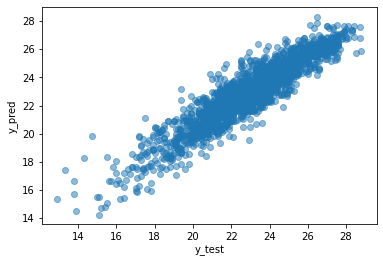

In [115]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [116]:
mean_squared_error(y_test,y_pred)

0.9400612900847127

### RMSE

In [117]:
np.sqrt(mean_squared_error(y_test,y_pred))

0.9695675789158343

### r2 score

In [118]:
r2_score(y_test,y_pred)

0.8516304434991989

In [45]:
# Linear Regression accuracy score 85%

## Random Forest Regressor Model

In [119]:
rf = RandomForestRegressor()
rf.fit(x_train,y_train)

RandomForestRegressor()

In [120]:
# adjusted r2 score
rf.score(x_train,y_train)

0.9866418189633482

In [121]:
rf.score(x_test,y_test)

0.9104551371178823

In [122]:
y_pred = rf.predict(x_test)
y_pred

array([22.743    , 26.062    , 23.331    , ..., 22.947    , 26.034    ,
       22.4303222])

### Scatter plot of Random Forest Regressor

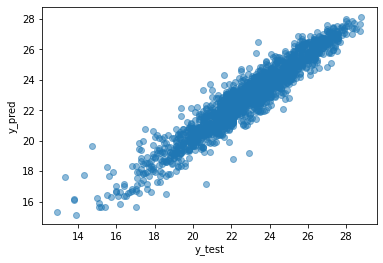

In [125]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [126]:
mean_squared_error(y_test,y_pred)

0.5673512902963201

### RMSE

In [127]:
np.sqrt(mean_squared_error(y_test,y_pred))

0.7532272501020659

### r2 score

In [128]:
r2_score(y_test,y_pred)

0.9104551371178823

In [46]:
# Random Forest Regressor accuracy score 91%

## Decision Tree Regressor

In [129]:
dt = DecisionTreeRegressor()
dt.fit(x_train,y_train)

DecisionTreeRegressor()

In [130]:
# adjusted r2 score
dt.score(x_train,y_train)

1.0

In [131]:
dt.score(x_test,y_test)

0.8023499031655676

In [132]:
y_pred = dt.predict(x_test)
y_pred

array([22. , 27. , 23.7, ..., 22.7, 24.8, 23.7])

### Scatter plot of Decision Tree Regressor Model

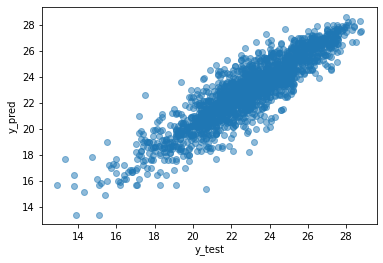

In [133]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [134]:
# checking mean squared error

mean_squared_error(y_test,y_pred)

1.2523000634199626

### RMSE

In [135]:
np.sqrt(mean_squared_error(y_test,y_pred))

1.1190621356385724

### r2 score

In [136]:
r2_score(y_test,y_pred)

0.8023499031655676

In [47]:
# Decision Tree Regressor accuracy score 80%

## AdaBoost Regressor

In [137]:
ada = AdaBoostRegressor()
ada.fit(x_train,y_train)

AdaBoostRegressor()

In [138]:
# adjusted r2 score
ada.score(x_train,y_train)

0.8175102783479017

In [139]:
ada.score(x_test,y_test)

0.813087777927465

In [140]:
y_pred = ada.predict(x_test)
y_pred

array([22.07612573, 25.11209236, 22.2860179 , ..., 23.17982804,
       25.11209236, 22.27992913])

### Scatter plot of Decision Tree Regressor Model

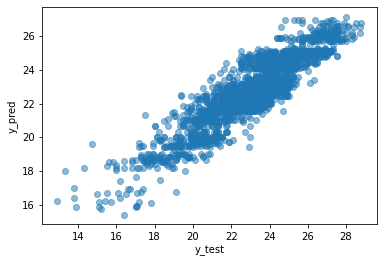

In [141]:
plt.scatter(y_test, y_pred, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [142]:
mean_squared_error(y_test,y_pred)

1.1842654838235556

### RMSE

In [143]:
np.sqrt(mean_squared_error(y_test,y_pred))

1.0882396261042673

### r2 score

In [144]:
r2_score(y_test,y_pred)

0.813087777927465

In [48]:
# AdaBoost Regressor accuracy score 81%

### Hyperparameter Tuning in Random Forest Regressor Model

### Using RandomizedSearchCV method for improving the r2 score

In [145]:
#Randomized Search CV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]

In [146]:
# Create the random grid

random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

In [147]:
# Random search of parameters, using 5 fold cross validation, 
# search across 100 different combinations
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [148]:
rf_random.fit(x_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=  10.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=  10.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   9.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=  14.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=  14.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [176]:
rf_random.best_params_

{'n_estimators': 1000,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 25}

In [177]:
prediction = rf_random.predict(x_test)

### Scatter Plot

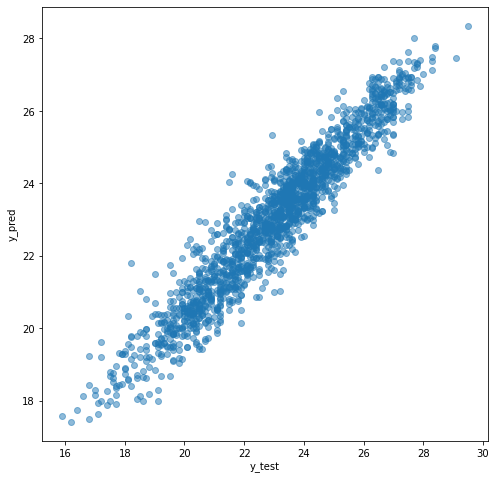

In [178]:
plt.figure(figsize = (8,8))
plt.scatter(y_test, prediction, alpha = 0.5)
plt.xlabel("y_test")
plt.ylabel("y_pred")
plt.show()

### MSE

In [179]:
mean_squared_error(y_test,y_pred)

1.1120681756708846

### RMSE

In [180]:
np.sqrt(mean_squared_error(y_test,y_pred))

1.05454643125416

### r2 score

In [181]:
r2_score(y_test,y_pred)

0.7943958107937347

In [49]:
# I have tried to improve the accuracy score for random forest regressor model but it is reducing the accuracy score.

### Regularization

In [182]:
# lasso regularization
lasscv = LassoCV(alphas = None,cv=10,max_iter=5000,normalize=True)

In [183]:
lasscv.fit(x_train,y_train)

LassoCV(cv=10, max_iter=5000, normalize=True)

In [184]:
# best alphas parameters
alpha = lasscv.alpha_
alpha

2.84723803622962e-05

In [185]:
# now we have best parameter lets use the lasso regularization
lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train,y_train)

Lasso(alpha=2.84723803622962e-05)

In [186]:
lasso_reg.score(x_test,y_test)

0.8348826938589142

In [50]:
# I have tried to improve the accuracy score for Linear Regression with the help of lasso but it is not increasing.

## Saving the Best Model

In [187]:
import pickle

In [188]:
# saving the Random Forest Regressor Model

filename = 'finalized_model.pickle'
pickle.dump(rf,open(filename,'wb'))

loaded_model = pickle.load(open(filename,'rb'))

In [51]:
from IPython.display import Image
Image(url= "https://i.ytimg.com/vi/xD0FJns7vX0/maxresdefault.jpg")

In [52]:
# The best model is Random Forest Regressor whose accuracy score is 91%